# Leaf Disease Detection using Faster R-CNN




#### Complete training pipeline for object detection with ResNet50 + FPN backbone

In [1]:
# STEP 1: Imports and Configuration
import json
import os
import numpy as np
from pathlib import Path
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import functional as F
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

print('✓ Libraries imported')

✓ Libraries imported


In [2]:
# STEP 2: Configuration
try:
    from google.colab import drive
    IN_COLAB = True
    drive.mount('/content/drive', force_remount=True)
    DATASET_DIR = Path('/content/drive/MyDrive/computer vision course/projects/R-CNN Projects/Dataset')
    BATCH_SIZE = 8
    NUM_WORKERS = 2
except ImportError:
    IN_COLAB = False
    BASE_DIR = Path(r"e:\courses\AI\9- Computer vision\3- Projects\6- Object Detection via R-CNN and it's family")
    DATASET_DIR = BASE_DIR / "Dataset"
    BATCH_SIZE = 4
    NUM_WORKERS = 0

TRAIN_DIR = DATASET_DIR / "train"
VALID_DIR = DATASET_DIR / "valid"
TEST_DIR = DATASET_DIR / "test"

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
NUM_EPOCHS = 10
LEARNING_RATE = 0.001

print(f'✓ Device: {DEVICE}')
print(f'✓ Dataset: {DATASET_DIR}')
print(f'✓ Batch Size: {BATCH_SIZE}')

Mounted at /content/drive
✓ Device: cuda
✓ Dataset: /content/drive/MyDrive/computer vision course/projects/R-CNN Projects/Dataset
✓ Batch Size: 8


In [3]:
# STEP 3: Load COCO Annotations
coco_train_path = TRAIN_DIR / "_annotations.coco.json"
with open(coco_train_path, 'r') as f:
    coco_data = json.load(f)

categories_dict = {}
for cat in coco_data['categories']:
    categories_dict[cat['id']] = cat['name']

print(f'✓ Classes: {categories_dict}')
print(f'✓ Total train images: {len(coco_data["images"])}')
print(f'✓ Total annotations: {len(coco_data["annotations"])}')

✓ Classes: {0: 'leaf-disease', 1: 'mildew', 2: 'rose_P01', 3: 'rose_R02'}
✓ Total train images: 1589
✓ Total annotations: 7689


In [4]:
# STEP 4: Custom COCO Dataset Class
class COCODataset(Dataset):
    """Load images and convert COCO format [x,y,w,h] to [x1,y1,x2,y2]"""

    def __init__(self, img_dir, annotations_path, categories_dict):
        with open(annotations_path, 'r') as f:
            self.coco_data = json.load(f)

        self.img_dir = Path(img_dir)
        self.categories_dict = categories_dict

        # Create image_id → metadata mapping
        self.image_metadata = {img['id']: img for img in self.coco_data['images']}

        # Create image_id → annotations mapping
        self.image_annotations = {}
        for ann in self.coco_data['annotations']:
            img_id = ann['image_id']
            if img_id not in self.image_annotations:
                self.image_annotations[img_id] = []
            self.image_annotations[img_id].append(ann)

        self.image_ids = list(self.image_metadata.keys())

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_meta = self.image_metadata[img_id]

        img_path = self.img_dir / img_meta['file_name']
        image = Image.open(img_path).convert('RGB')

        annotations = self.image_annotations.get(img_id, [])

        boxes = []
        labels = []

        for ann in annotations:
            x, y, w, h = ann['bbox']
            boxes.append([x, y, x + w, y + h])
            labels.append(ann['category_id'])

        if len(boxes) > 0:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)
        else:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)

        image = F.to_tensor(image)

        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([img_id], dtype=torch.int64)
        }

        return image, target

print('✓ COCODataset class defined')

✓ COCODataset class defined


In [5]:
# STEP 5: Collate Function for Variable-Size Batches
def collate_fn(batch):
    """Return lists instead of stacked tensors to handle variable box counts"""
    images = []
    targets = []

    for image, target in batch:
        images.append(image)
        targets.append(target)

    return images, targets

print('✓ Collate function defined')

✓ Collate function defined


In [6]:
# STEP 6: Visualization Function
def visualize_detection(image, targets, categories_dict, title=""):
    """Draw bounding boxes with class labels"""
    class_colors = {
        0: (100, 100, 100),      # leaf-disease: gray
        1: (255, 165, 0),        # mildew: orange
        2: (255, 0, 0),          # rose_P01: red
        3: (0, 0, 255)           # rose_R02: blue
    }

    image_np = image.permute(1, 2, 0).cpu().numpy()
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(image_np)

    boxes = targets['boxes'].cpu().numpy()
    labels = targets['labels'].cpu().numpy()

    for box, label in zip(boxes, labels):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1

        rgb_color = class_colors.get(label, (200, 200, 200))
        plot_color = tuple(c / 255.0 for c in rgb_color)

        rect = patches.Rectangle(
            (x1, y1), width, height,
            linewidth=2.5,
            edgecolor=plot_color,
            facecolor='none'
        )
        ax.add_patch(rect)

        class_name = categories_dict[label]
        ax.text(x1, y1 - 8, f'{class_name}',
               color=plot_color, fontsize=11, weight='bold',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))

    ax.set_title(title, fontsize=14, weight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()

print('✓ Visualization function defined')

✓ Visualization function defined


[Load Datasets]
✓ Train: 1589 images
✓ Valid: 616 images
✓ Test: 296 images


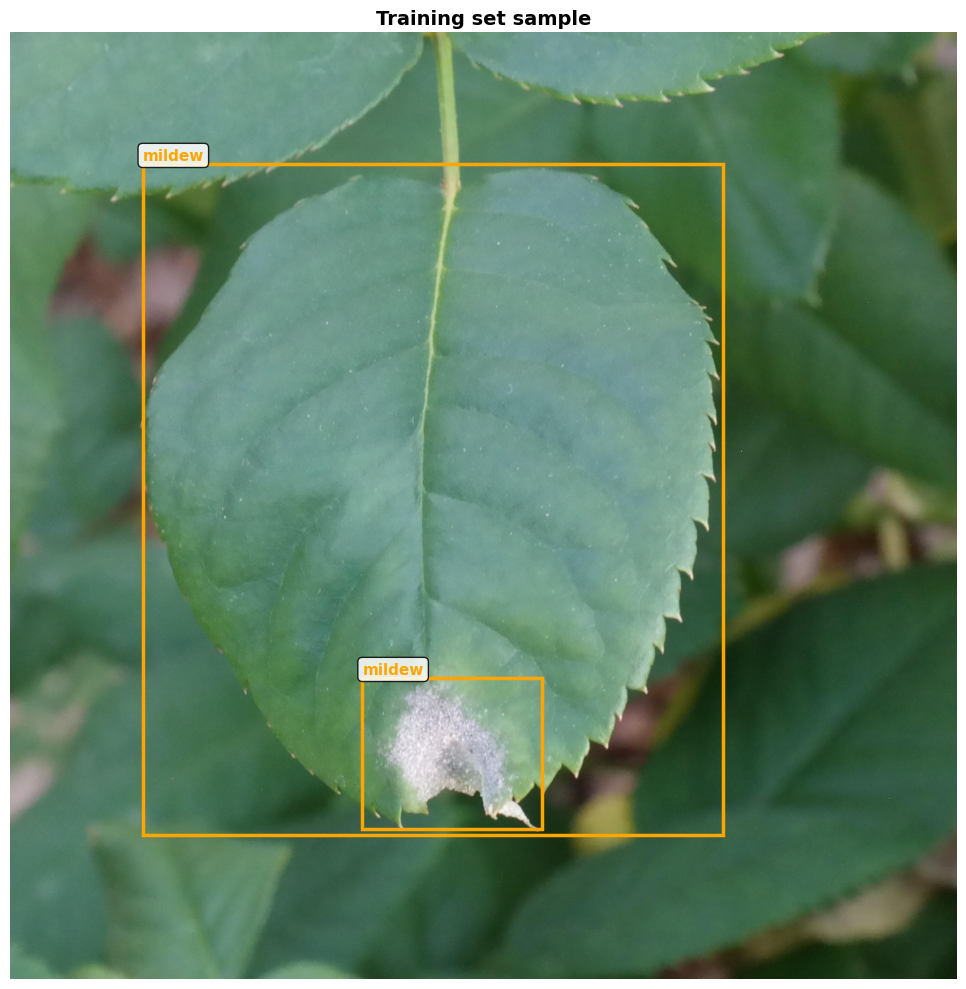

In [7]:
# STEP 7: Load Datasets
print('[Load Datasets]')
train_dataset = COCODataset(TRAIN_DIR, TRAIN_DIR / "_annotations.coco.json", categories_dict)
valid_dataset = COCODataset(VALID_DIR, VALID_DIR / "_annotations.coco.json", categories_dict)
test_dataset = COCODataset(TEST_DIR, TEST_DIR / "_annotations.coco.json", categories_dict)

print(f'✓ Train: {len(train_dataset)} images')
print(f'✓ Valid: {len(valid_dataset)} images')
print(f'✓ Test: {len(test_dataset)} images')

# Visualize sample
sample_idx = 3
image, target = train_dataset[sample_idx]
visualize_detection(image, target, categories_dict, title="Training set sample")

In [8]:
# STEP 8: Create DataLoaders
print('[Create DataLoaders]')
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn
)

print(f'✓ Train batches: {len(train_loader)}')
print(f'✓ Valid batches: {len(valid_loader)}')
print(f'✓ Test batches: {len(test_loader)}')

[Create DataLoaders]
✓ Train batches: 199
✓ Valid batches: 77
✓ Test batches: 37


In [9]:
# STEP 9: Load and Modify Model
print('[Load Model]')
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Modify classification head for 4 classes
num_classes = 4
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model = model.to(DEVICE)
print(f'✓ Model loaded with {num_classes} classes')
total_params = sum(p.numel() for p in model.parameters())
print(f'✓ Total parameters: {total_params:,}')

[Load Model]
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 184MB/s]


✓ Model loaded with 4 classes
✓ Total parameters: 41,309,411


In [10]:
# STEP 10: Training Loop
print('[Training]')
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

train_losses = []
valid_losses = []
epoch_list = []

for epoch in range(NUM_EPOCHS):
    print(f'\nEpoch {epoch+1}/{NUM_EPOCHS}')

    # Training phase
    model.train()
    total_train_loss = 0
    num_batches = 0

    progress_bar = tqdm(train_loader, desc="Training", leave=False)
    for images, targets in progress_bar:
        images = [img.to(DEVICE) for img in images]
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        total_train_loss += losses.item()
        num_batches += 1
        progress_bar.set_postfix({'loss': f'{total_train_loss/num_batches:.4f}'})

    avg_train_loss = total_train_loss / num_batches
    train_losses.append(avg_train_loss)
    print(f'  Train Loss: {avg_train_loss:.4f}')

    # Validation phase
    model.eval()
    total_valid_loss = 0
    num_valid_batches = 0

    with torch.no_grad():
        progress_bar = tqdm(valid_loader, desc="Validation", leave=False)
        for images, targets in progress_bar:
            images = [img.to(DEVICE) for img in images]
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

            # Temporarily set to train mode to get loss dict during validation
            model.train()
            loss_dict = model(images, targets)
            model.eval()

            losses = sum(loss for loss in loss_dict.values())

            total_valid_loss += losses.item()
            num_valid_batches += 1
            progress_bar.set_postfix({'loss': f'{total_valid_loss/num_valid_batches:.4f}'})

    avg_valid_loss = total_valid_loss / num_valid_batches
    valid_losses.append(avg_valid_loss)
    print(f'  Valid Loss: {avg_valid_loss:.4f}')

    epoch_list.append(epoch + 1)

    # Save best model
    if avg_valid_loss == min(valid_losses):
        best_path = '/content/model_best.pth' if IN_COLAB else 'model_best.pth'
        torch.save(model.state_dict(), best_path)
        print(f'  ✓ Best model saved!')

# Save final model
final_path = '/content/model_final.pth' if IN_COLAB else 'model_final.pth'
torch.save(model.state_dict(), final_path)
print(f'\n✓ Training completed!')
print(f'  Train Loss: {train_losses[-1]:.4f}')
print(f'  Valid Loss: {valid_losses[-1]:.4f}')

[Training]

Epoch 1/10


  Train Loss: 0.8755


  Valid Loss: 0.6541
  ✓ Best model saved!

Epoch 2/10


  Train Loss: 0.6706


  Valid Loss: 0.6616

Epoch 3/10


  Train Loss: 0.6445


  Valid Loss: 0.6909

Epoch 4/10


  Train Loss: 0.6047


  Valid Loss: 0.5915
  ✓ Best model saved!

Epoch 5/10


  Train Loss: 0.5687


  Valid Loss: 0.6155

Epoch 6/10


  Train Loss: 0.5352


  Valid Loss: 0.6114

Epoch 7/10


  Train Loss: 0.5175


  Valid Loss: 0.5556
  ✓ Best model saved!

Epoch 8/10


  Train Loss: 0.5053


  Valid Loss: 0.6802

Epoch 9/10


  Train Loss: 0.4875


  Valid Loss: 0.5601

Epoch 10/10


  Train Loss: 0.4740


  Valid Loss: 0.6208

✓ Training completed!
  Train Loss: 0.4740
  Valid Loss: 0.6208


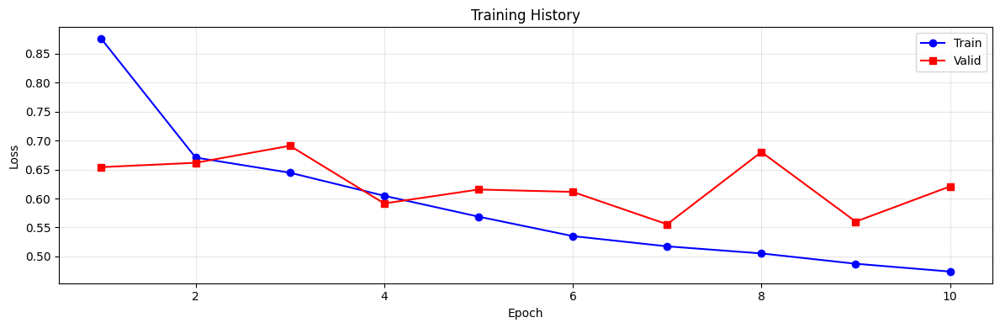

✓ Training history plot saved


In [11]:
# STEP 11: Plot Training History
plt.figure(figsize=(12, 4))
plt.plot(epoch_list, train_losses, 'b-', label='Train', marker='o')
plt.plot(epoch_list, valid_losses, 'r-', label='Valid', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training History')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
save_path = '/content/training_history.png' if IN_COLAB else 'training_history.png'
plt.savefig(save_path, dpi=150)
plt.show()
print('✓ Training history plot saved')

In [18]:
# STEP 12: Load Best Model for Testing
print('[Testing]')
best_path = '/content/model_best.pth' if IN_COLAB else 'model_best.pth'
model.load_state_dict(torch.load(best_path))
print('✓ Best model loaded')

def get_predictions(model, image, device, confidence_threshold=0.5):
    """Get predictions on single image"""
    model.eval()
    with torch.no_grad():
        # Correctly prepare the image: move to device and wrap in a list
        # The model expects a list of 3D tensors [C, H, W], not a 4D tensor [1, C, H, W]
        predictions = model([image.to(device)])[0]

    boxes = predictions['boxes'].cpu().numpy()
    labels = predictions['labels'].cpu().numpy()
    scores = predictions['scores'].cpu().numpy()

    mask = scores > confidence_threshold
    return boxes[mask], labels[mask], scores[mask]

print('✓ Prediction function defined')

[Testing]
✓ Best model loaded
✓ Prediction function defined


In [19]:
# STEP 13: Test on Random Samples
num_samples = 3
test_indices = np.random.choice(len(test_dataset), min(num_samples, len(test_dataset)), replace=False)

for idx in range(len(test_indices)):
    image, target = test_dataset[test_indices[idx]]
    # The image from the dataset is already a 3D tensor [C, H, W].
    # The model expects a list of 3D tensors, so we pass [image.to(DEVICE)]
    boxes, labels, scores = get_predictions(model, image, DEVICE, confidence_threshold=0.5)
    print(f'✓ Test sample {idx+1}: {len(labels)} detections')

✓ Test sample 1: 0 detections
✓ Test sample 2: 1 detections
✓ Test sample 3: 10 detections


In [26]:
# STEP 14: Calculate Test Loss
print('Calculating test loss...')
model.eval()
total_test_loss = 0
num_test_batches = 0

for images, targets in tqdm(test_loader):
    images = [img.to(DEVICE) for img in images]
    targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

    with torch.no_grad():
        # Temporarily set to train mode to get loss dict during test loss calculation
        model.train()
        loss_dict = model(images, targets)
        model.eval()

        losses = sum(loss for loss in loss_dict.values())
        total_test_loss += losses.item()
        num_test_batches += 1

avg_test_loss = total_test_loss / num_test_batches

print(f'\nTest Loss: {avg_test_loss:.4f}')
print(f'Training Summary:')
print(f'  Train: {train_losses[-1]:.4f}')
print(f'  Valid: {valid_losses[-1]:.4f}')
print(f'  Test:  {avg_test_loss:.4f}')

Calculating test loss...


100%|██████████| 37/37 [01:54<00:00,  3.10s/it]



Test Loss: 0.3841
Training Summary:
  Train: 0.4740
  Valid: 0.6208
  Test:  0.3841


In [32]:
# Install torchmetrics for mAP calculation
!pip install torchmetrics

print('✓ torchmetrics installed')

✓ torchmetrics installed


In [33]:
# STEP 16: Import MeanAveragePrecision
from torchmetrics.detection import MeanAveragePrecision

print('✓ MeanAveragePrecision imported')

✓ MeanAveragePrecision imported


In [34]:
# STEP 17: Function to collect predictions and ground truths for mAP
def collect_predictions_and_targets(model, dataloader, device, confidence_threshold=0.5):
    model.eval()
    preds_formatted = []
    targets_formatted = []

    print(f'Collecting predictions and targets from {len(dataloader)} batches...')

    with torch.no_grad():
        for images, targets in tqdm(dataloader, desc="Collecting data"):
            images = [img.to(device) for img in images]

            # Get raw predictions from the model
            outputs = model(images)

            for i in range(len(outputs)):
                # Process model output for predictions
                boxes = outputs[i]['boxes']
                labels = outputs[i]['labels']
                scores = outputs[i]['scores']

                # Apply confidence thresholding
                mask = scores > confidence_threshold
                boxes_filtered = boxes[mask]
                labels_filtered = labels[mask]
                scores_filtered = scores[mask]

                preds_formatted.append({
                    "boxes": boxes_filtered,
                    "scores": scores_filtered,
                    "labels": labels_filtered,
                })

                # Process ground truth targets
                targets_formatted.append({
                    "boxes": targets[i]['boxes'].to(device),
                    "labels": targets[i]['labels'].to(device),
                })
    return preds_formatted, targets_formatted

print('✓ Prediction and target collection function defined')

✓ Prediction and target collection function defined


In [39]:
# STEP 18: Calculate mAP
print('[Calculating mAP]')

metric = MeanAveragePrecision(box_format="xyxy", iou_type="bbox")

# Collect predictions and targets
preds, gts = collect_predictions_and_targets(model, test_loader, DEVICE, confidence_threshold=0.5)

# Update metric with predictions and ground truths
metric.update(preds, gts)

# Compute and print the results
mAP_results = metric.compute()

print('\n✓ mAP Calculation Results:')
for k, v in mAP_results.items():
    if isinstance(v, torch.Tensor):
        if v.numel() == 1:
            print(f'  {k}: {v.item():.4f}')
        else:
            print(f'  {k}: {v.tolist()}') # Convert multi-element tensors to list
    else:
        print(f'  {k}: {v}')

# Optionally, you can add this to your training results JSON
if 'results' in locals() and isinstance(results, dict):
    results['mAP'] = {k: (v.item() if isinstance(v, torch.Tensor) else v) for k, v in mAP_results.items()}
    results_path = '/content/training_results.json' if IN_COLAB else 'training_results.json'
    with open(results_path, 'w') as f:
        json.dump(results, f, indent=4)
    print(f'✓ mAP results added to {results_path}')

print('\n✅ mAP calculation complete!')

[Calculating mAP]



✓ mAP Calculation Results:
  map: 0.4172
  map_50: 0.7497
  map_75: 0.4571
  map_small: -1.0000
  map_medium: 0.1895
  map_large: 0.4281
  mar_1: 0.3422
  mar_10: 0.4692
  mar_100: 0.4900
  mar_small: -1.0000
  mar_medium: 0.2308
  mar_large: 0.5024
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: [1, 2, 3]

✅ mAP calculation complete!


In [40]:
# STEP 15: Save Results
print('[Saving Results]')

results = {
    'train_losses': [float(x) for x in train_losses],
    'valid_losses': [float(x) for x in valid_losses],
    'test_loss': float(avg_test_loss),
    'epochs': epoch_list,
    'classes': categories_dict
}

results_path = '/content/training_results.json' if IN_COLAB else 'training_results.json'
with open(results_path, 'w') as f:
    json.dump(results, f, indent=4)

print('✓ Results saved!')
print('✓ Model files: model_best.pth, model_final.pth')
print('✓ Training history: training_history.png')
print('✓ Results summary: training_results.json')
print('\n✅ Pipeline complete!')

[Saving Results]
✓ Results saved!
✓ Model files: model_best.pth, model_final.pth
✓ Training history: training_history.png
✓ Results summary: training_results.json

✅ Pipeline complete!


[Visualizing Test Predictions]


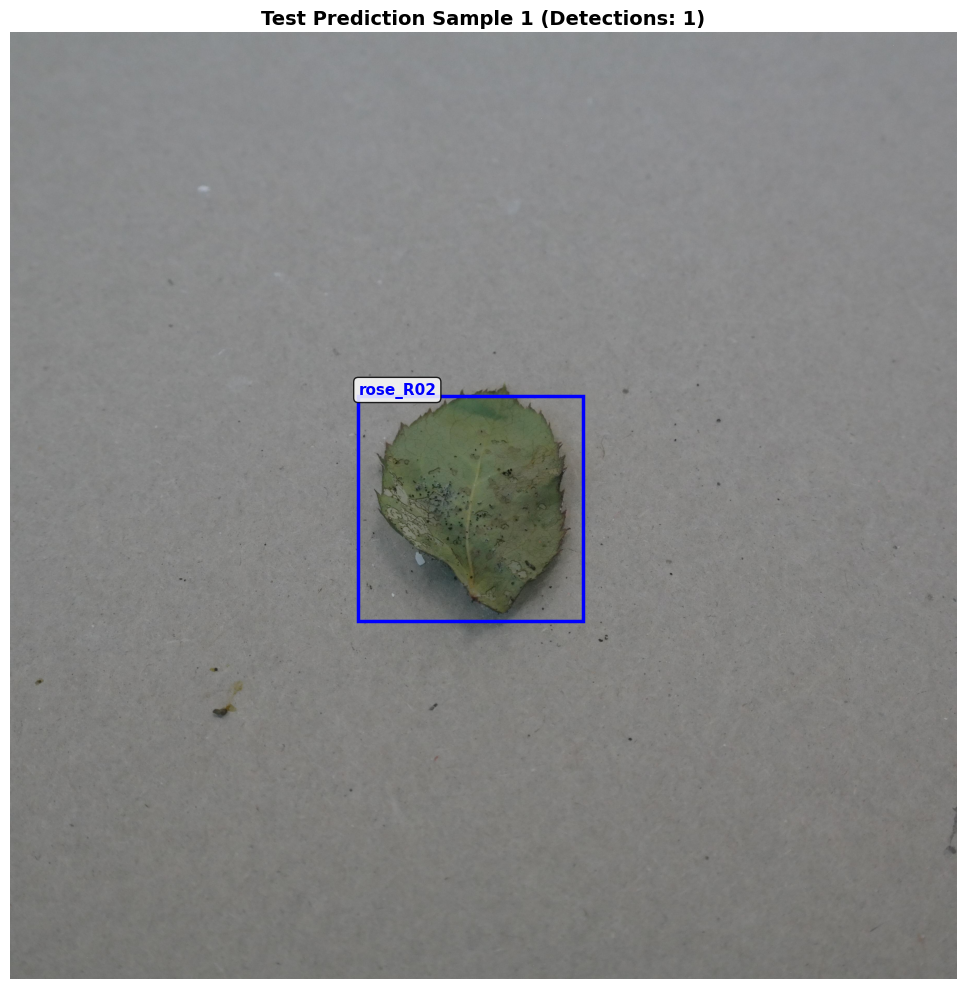

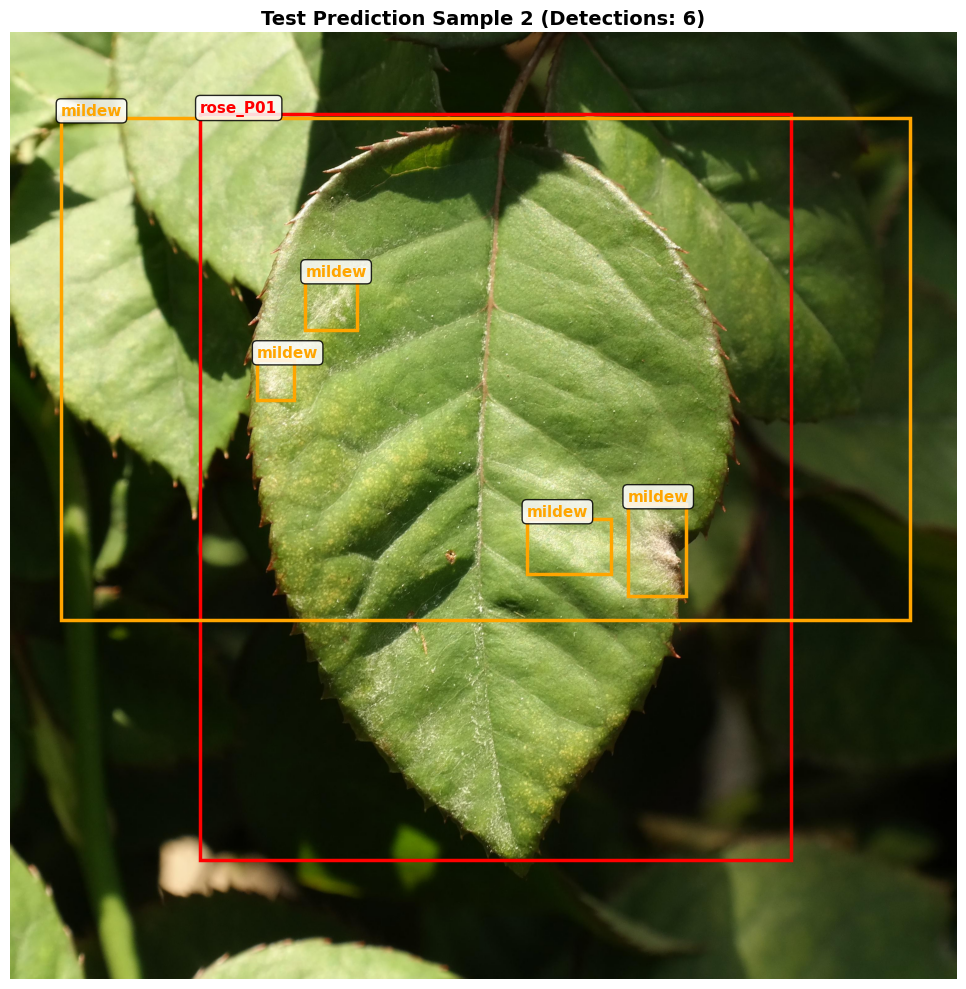

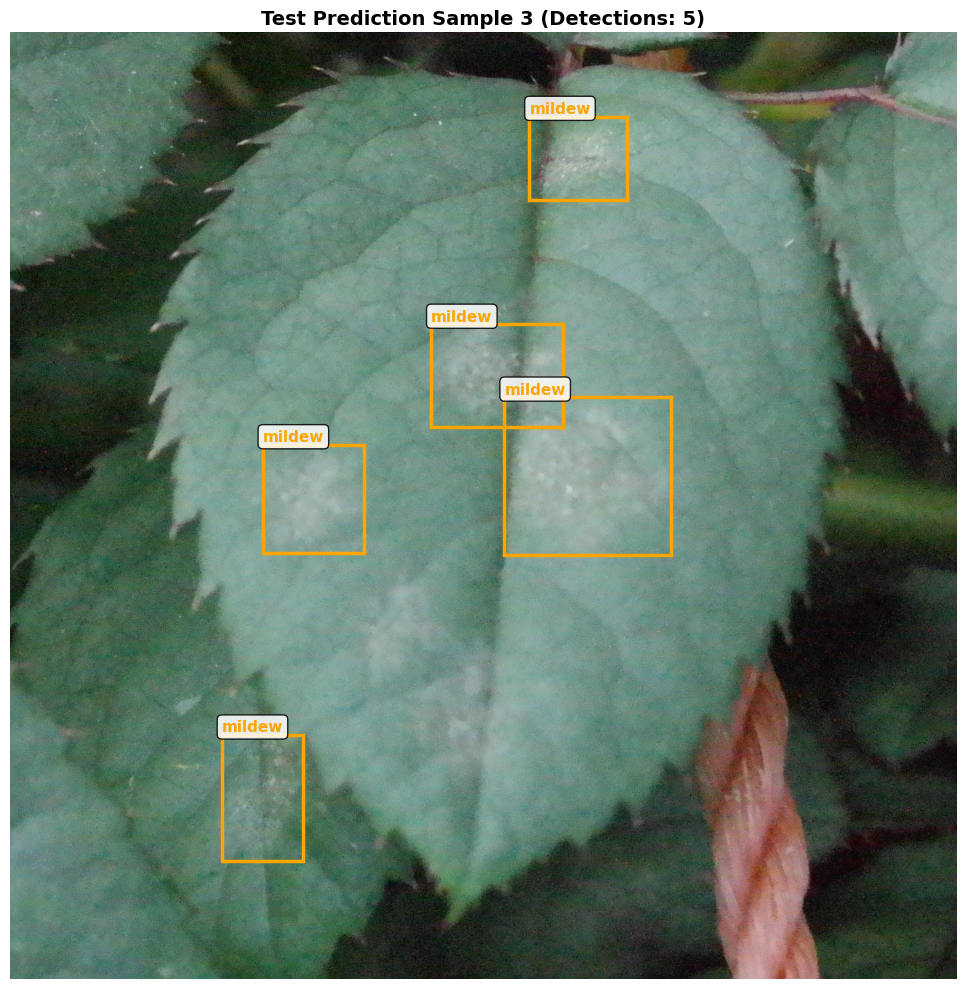

✓ Test predictions visualized


In [41]:
# STEP 19: Visualize Test Predictions
print('[Visualizing Test Predictions]')

num_samples_to_visualize = 3 # You can change this number
test_sample_indices = np.random.choice(len(test_dataset), num_samples_to_visualize, replace=False)

for i, idx in enumerate(test_sample_indices):
    image, ground_truth_target = test_dataset[idx]

    # Get predictions for the current image
    predicted_boxes, predicted_labels, predicted_scores = get_predictions(model, image, DEVICE, confidence_threshold=0.5)

    # Format predictions for visualization function
    predicted_target = {
        'boxes': torch.tensor(predicted_boxes, dtype=torch.float32),
        'labels': torch.tensor(predicted_labels, dtype=torch.int64),
        'scores': torch.tensor(predicted_scores, dtype=torch.float32)
    }

    # Visualize the image with predictions
    visualize_detection(image, predicted_target, categories_dict, title=f"Test Prediction Sample {i+1} (Detections: {len(predicted_labels)})")

print('✓ Test predictions visualized')


[Visualizing True vs. Predicted Results]


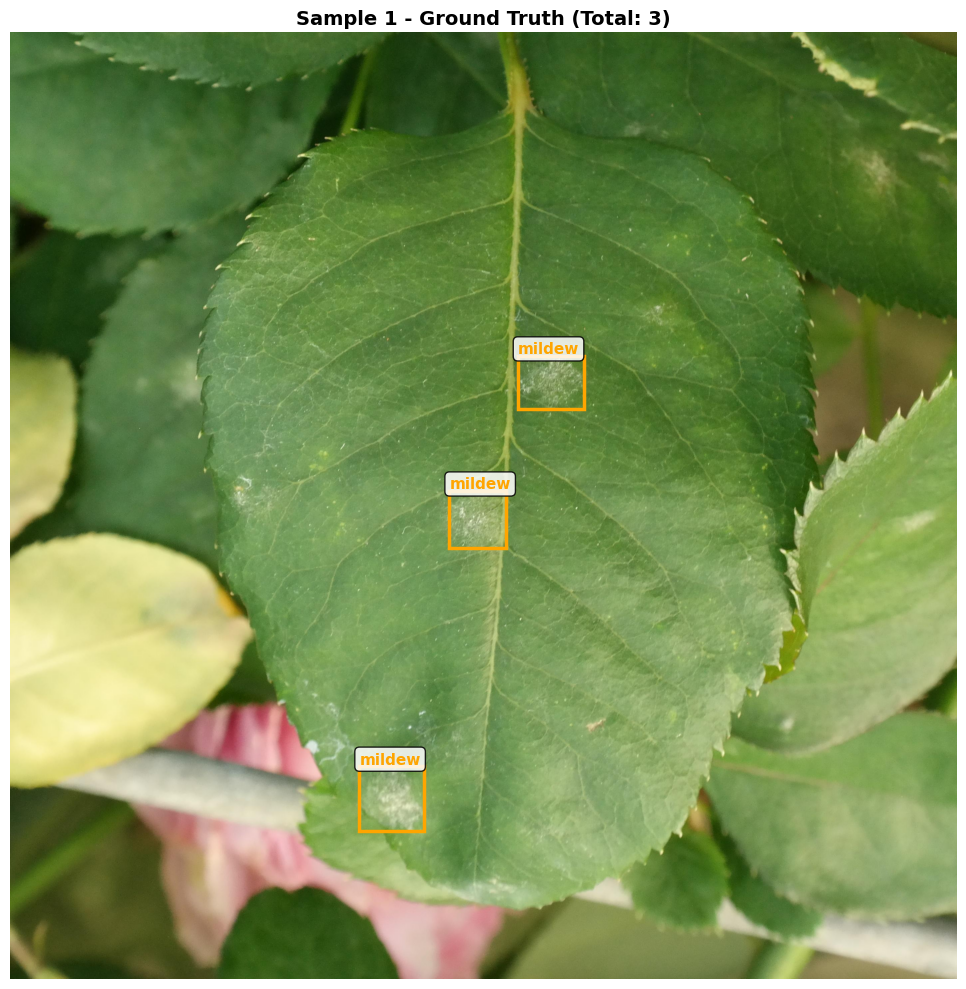

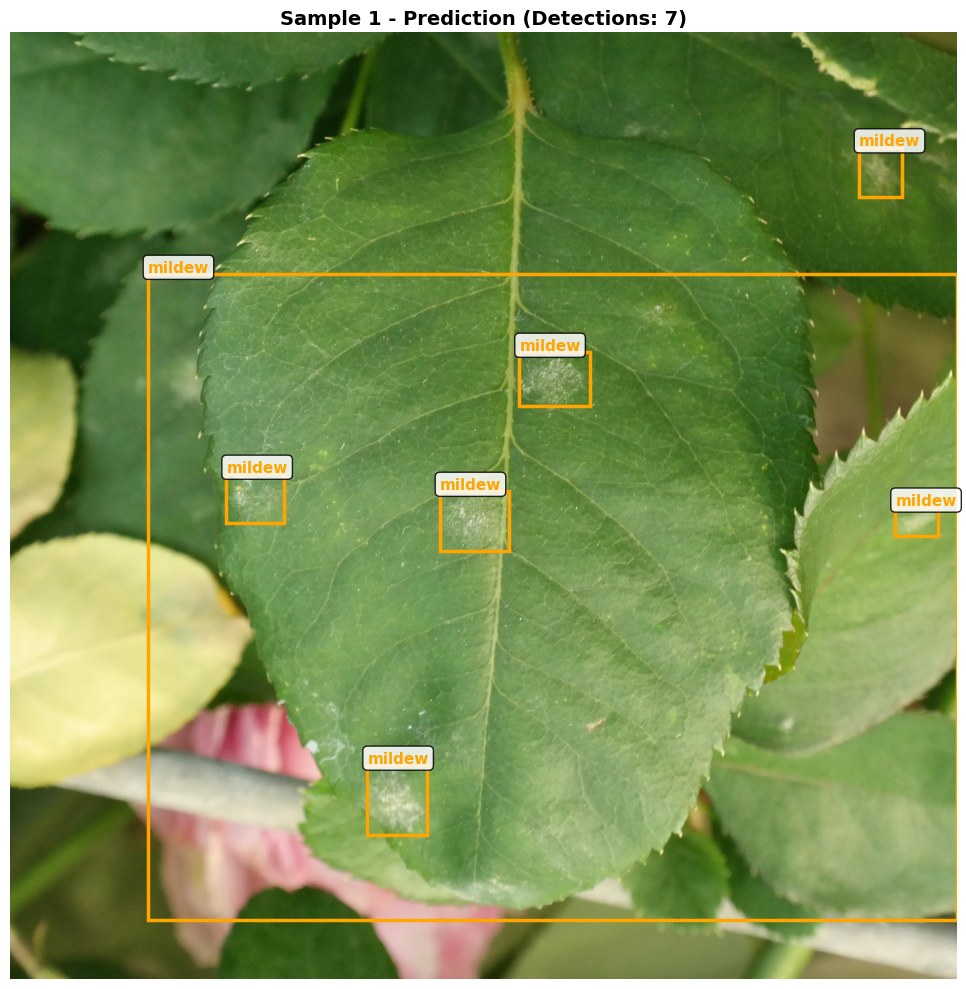

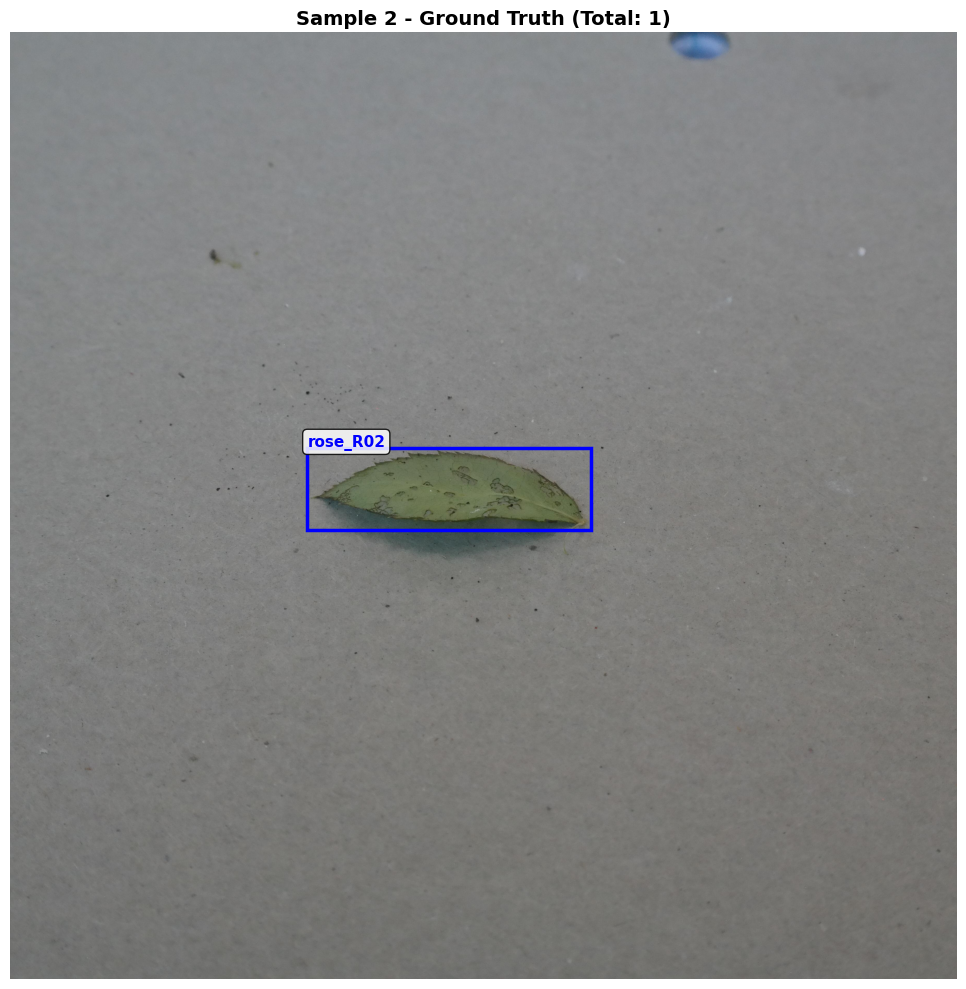

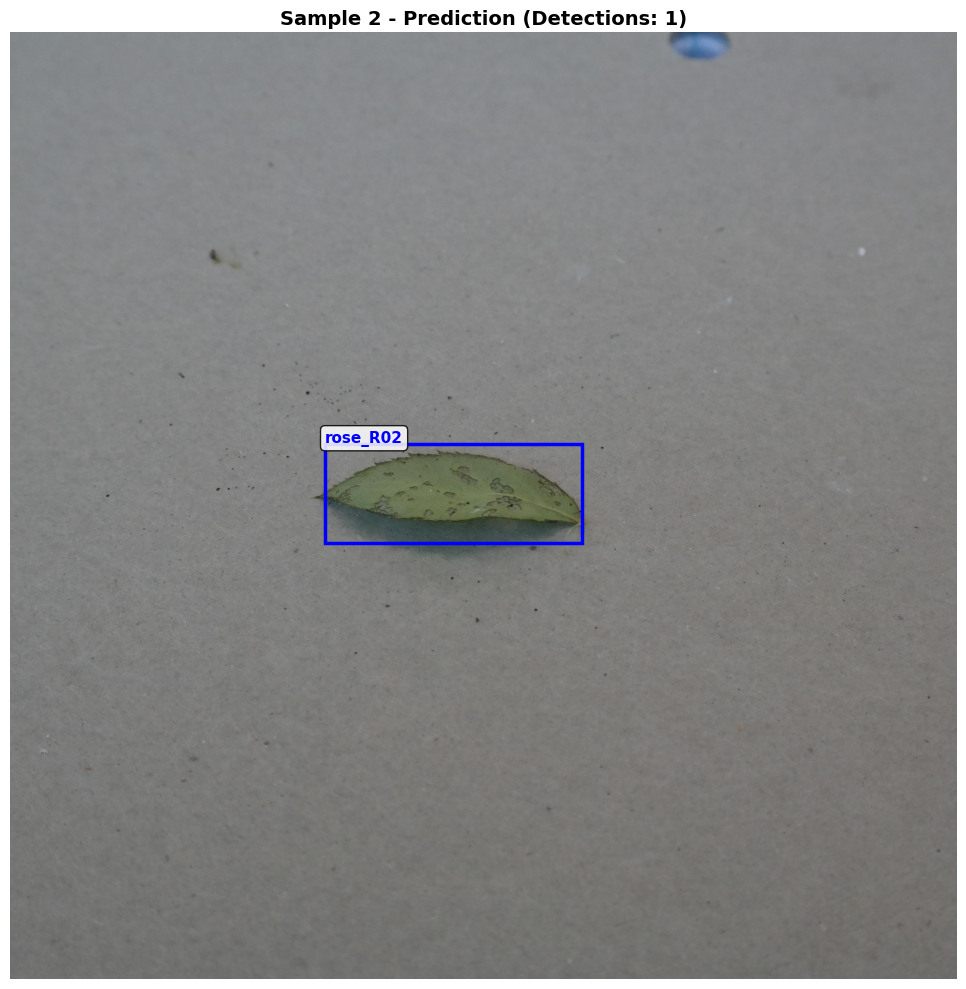

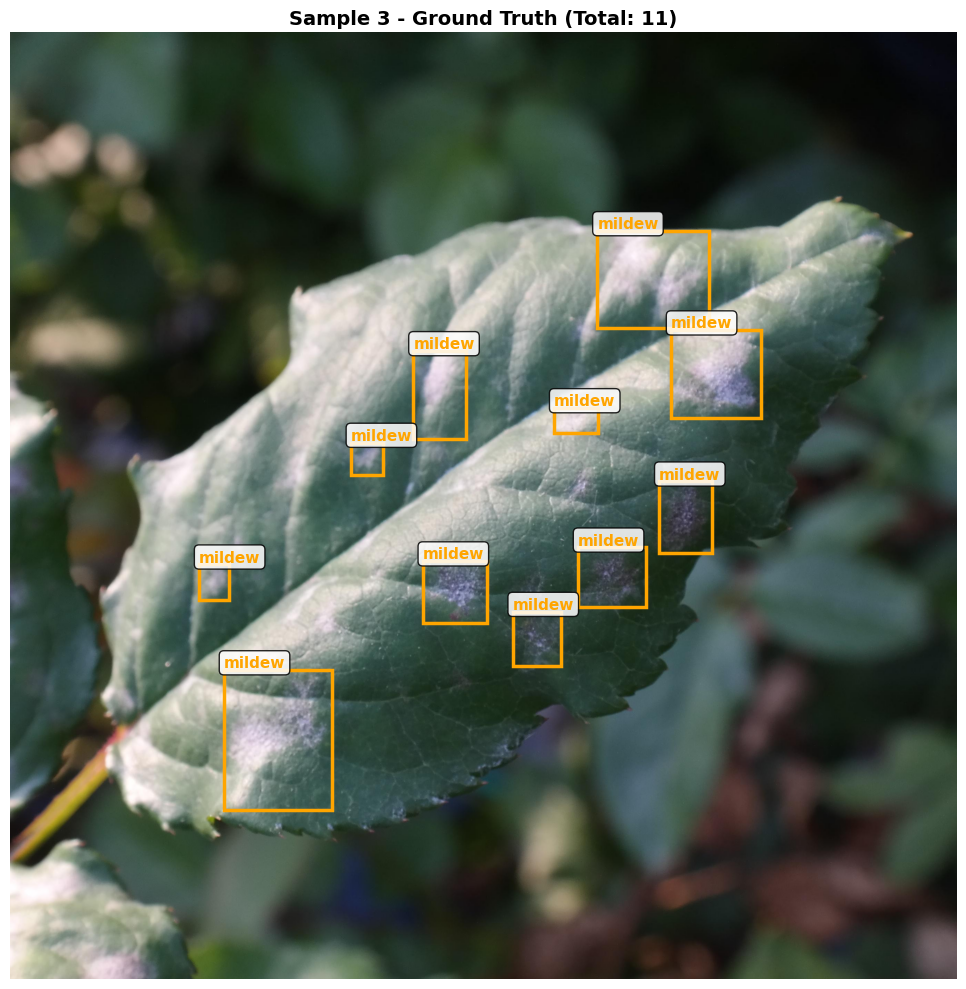

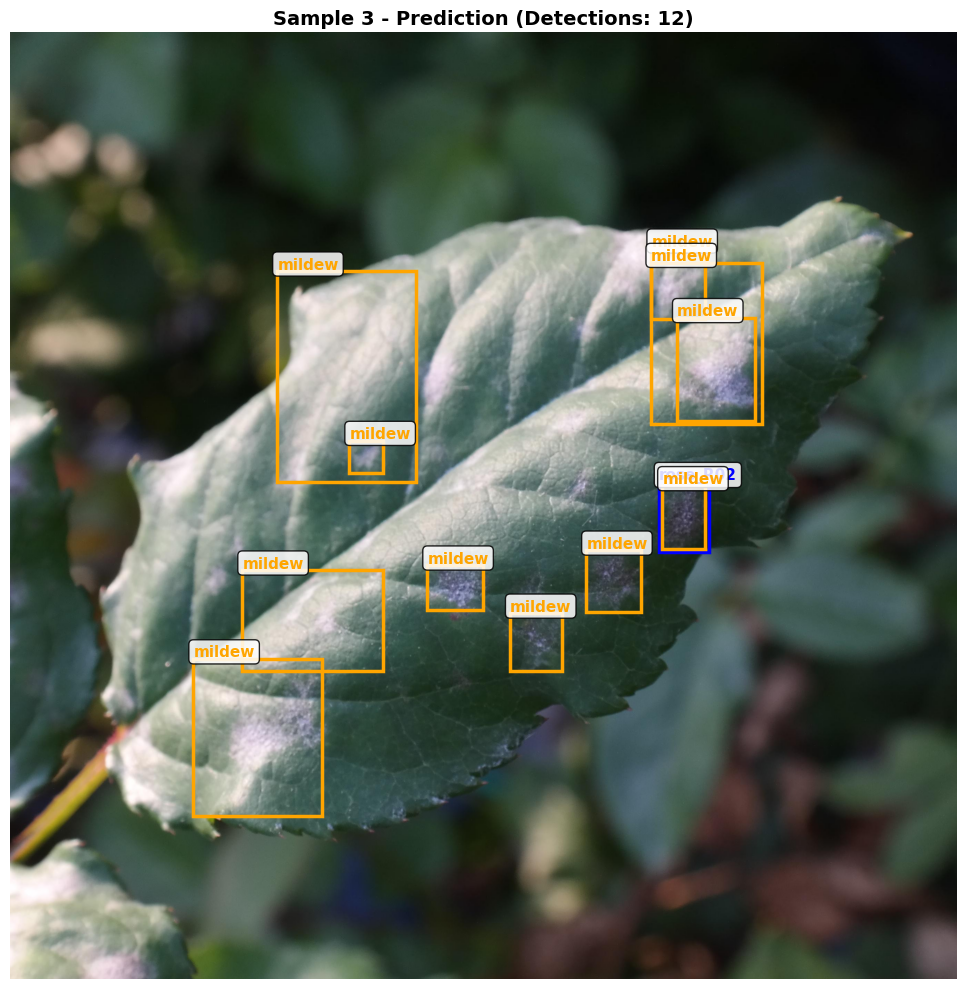

✓ True vs. Predicted results visualized


In [42]:
# STEP 20: Visualize True vs. Predicted Results
print('[Visualizing True vs. Predicted Results]')

num_samples_to_compare = 3  # Adjust this number to see more or fewer comparisons
test_sample_indices = np.random.choice(len(test_dataset), num_samples_to_compare, replace=False)

for i, idx in enumerate(test_sample_indices):
    image, ground_truth_target = test_dataset[idx]

    # Get predictions for the current image
    predicted_boxes, predicted_labels, predicted_scores = get_predictions(model, image, DEVICE, confidence_threshold=0.5)

    # Format predictions for visualization function
    predicted_target = {
        'boxes': torch.tensor(predicted_boxes, dtype=torch.float32),
        'labels': torch.tensor(predicted_labels, dtype=torch.int64),
        'scores': torch.tensor(predicted_scores, dtype=torch.float32)
    }

    # Visualize Ground Truth
    visualize_detection(image, ground_truth_target, categories_dict, title=f"Sample {i+1} - Ground Truth (Total: {len(ground_truth_target['labels'])})")

    # Visualize Predictions
    visualize_detection(image, predicted_target, categories_dict, title=f"Sample {i+1} - Prediction (Detections: {len(predicted_labels)})")

print('✓ True vs. Predicted results visualized')

[Plotting mAP Results]


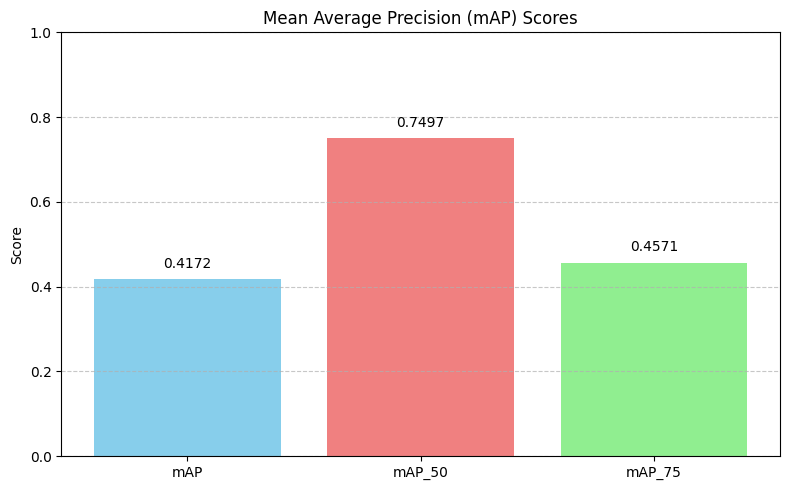

✓ mAP results plot saved


In [43]:
# STEP 21: Plot mAP Results
print('[Plotting mAP Results]')

# Extract relevant mAP metrics
map_scores = {
    'mAP': mAP_results['map'].item() if isinstance(mAP_results['map'], torch.Tensor) else mAP_results['map'],
    'mAP_50': mAP_results['map_50'].item() if isinstance(mAP_results['map_50'], torch.Tensor) else mAP_results['map_50'],
    'mAP_75': mAP_results['map_75'].item() if isinstance(mAP_results['map_75'], torch.Tensor) else mAP_results['map_75']
}

metrics = list(map_scores.keys())
values = list(map_scores.values())

plt.figure(figsize=(8, 5))
plt.bar(metrics, values, color=['skyblue', 'lightcoral', 'lightgreen'])
plt.ylim(0, 1) # mAP scores are between 0 and 1
plt.ylabel('Score')
plt.title('Mean Average Precision (mAP) Scores')

for i, v in enumerate(values):
    plt.text(i, v + 0.02, f'{v:.4f}', ha='center', va='bottom', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
save_path_map = '/content/map_results.png' if IN_COLAB else 'map_results.png'
plt.savefig(save_path_map, dpi=150)
plt.show()

print('✓ mAP results plot saved')
